In [2]:
from google.colab import drive
drive.mount("/content/drive")


Mounted at /content/drive


In [3]:
import shutil # for file operations
import zipfile, os, sys, random
from glob import glob
import pandas as pd # for data manipulation
import numpy as np # for dealing with arrays
from sklearn import preprocessing # for preprocessing purpose
import cv2 # for displaying the image
from matplotlib import patches # data visualization
import matplotlib.pyplot as plt # data visualization
%matplotlib inline

In [4]:
df = pd.read_csv("/content/drive/MyDrive/RBCdetection/annotations.csv")

In [5]:
df.head()

,image,xmin,ymin,xmax,ymax,label
0,image-100.png,0.000000,0.000000,25.190198,40.816803,rbc
1,image-100.png,15.010502,0.000000,68.337223,23.527421,rbc
2,image-100.png,25.017503,16.021004,78.374562,73.735123,rbc
3,image-100.png,75.565928,1.061844,140.248541,45.591599,rbc
4,image-100.png,77.483081,23.290548,131.936989,74.806301,rbc


In [6]:
# defining some functions for creating the necessary columns
img_width = 256
img_height = 256

def width(df):
  return (df.xmax - df.xmin)
def height(df):
  return (df.ymax - df.ymin)
def x_center(df):
  return (df.xmin + (df.width/2))
def y_center(df):
  return (df.ymin + (df.height/2))
def w_norm(df):
  return df/img_width
def h_norm(df):
  return df/img_height


In [7]:
le = preprocessing.LabelEncoder()
le.fit(df['label'])
print(le.classes_)

['rbc' 'wbc']


In [8]:
# applying the created functions
labels = le.transform(df['label'])
df['label'] = labels

df['width'] = df.apply(width, axis=1)
df['height'] = df.apply(height, axis=1)

df['x_center'] = df.apply(x_center, axis=1)
df['y_center'] = df.apply(y_center, axis=1)

df['x_center_norm'] = df['x_center'].apply(w_norm)
df['width_norm'] = df['width'].apply(w_norm)

df['y_center_norm'] = df['y_center'].apply(h_norm)
df['height_norm'] = df['height'].apply(h_norm)

In [9]:
df.head(5)


,image,xmin,ymin,xmax,ymax,label,width,height,x_center,y_center,x_center_norm,width_norm,y_center_norm,height_norm
0,image-100.png,0.000000,0.000000,25.190198,40.816803,0,25.190198,40.816803,12.595099,20.408401,0.049200,0.098399,0.079720,0.159441
1,image-100.png,15.010502,0.000000,68.337223,23.527421,0,53.326721,23.527421,41.673862,11.763711,0.162789,0.208308,0.045952,0.091904
2,image-100.png,25.017503,16.021004,78.374562,73.735123,0,53.357060,57.714119,51.696033,44.878063,0.201938,0.208426,0.175305,0.225446
3,image-100.png,75.565928,1.061844,140.248541,45.591599,0,64.682614,44.529755,107.907235,23.326721,0.421513,0.252666,0.091120,0.173944
4,image-100.png,77.483081,23.290548,131.936989,74.806301,0,54.453909,51.515753,104.710035,49.048425,0.409024,0.212711,0.191595,0.201233


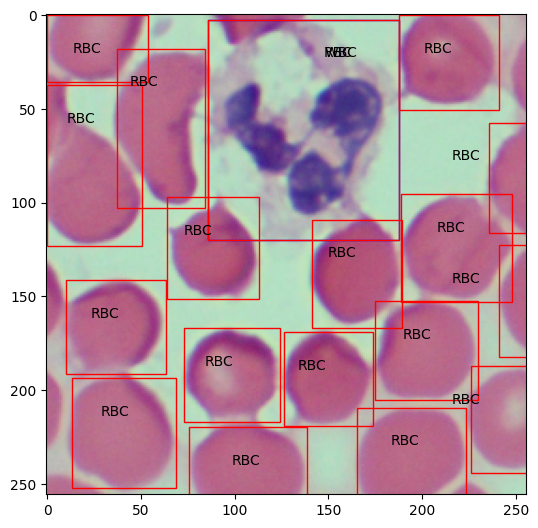

In [10]:
# showing a sample image with its ground truth
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
image = plt.imread('/content/drive/MyDrive/RBCdetection/images/image-1.png')
plt.imshow(image)

# iterating over the image for different objects
for _,row in df[df.image == "image-1.png"].iterrows():
    xmin = row.xmin
    xmax = row.xmax
    ymin = row.ymin
    ymax = row.ymax

    width = xmax - xmin
    height = ymax - ymin

    # assign different color to different classes of objects
    if row.label == 0:
        edgecolor = 'r'
        ax.annotate('RBC', xy=(xmax-40,ymin+20))
    elif row.label == 1:
        edgecolor = 'b'
        ax.annotate('WBC', xy=(xmax-40,ymin+20))

    # add bounding boxes to the image
    rect = patches.Rectangle((xmin,ymin), width, height, edgecolor = edgecolor, facecolor = 'none')

    ax.add_patch(rect)



In [11]:
# data splitting
df_train = df[0:2099]
df_val = df[2099:]
print(df_train.shape, df_val.shape)


(2099, 14) (241, 14)


In [12]:

# creating some folders for data segregation purpose
os.mkdir('/content/split/')
os.mkdir('/content/split/images/')
os.mkdir('/content/split/images/train/')
os.mkdir('/content/split/images/val/')

os.mkdir('/content/split/labels/')
os.mkdir('/content/split/labels/train/')
os.mkdir('/content/split/labels/val/')

In [13]:
# creating a function for data segregation
def segregate_data(df, img_path, label_path, train_img_path, train_label_path):
  filenames = []
  for filename in df.image:
    filenames.append(filename)
  filenames = set(filenames)

  for filename in filenames:
    yolo_list = []

    for _,row in df[df.image == filename].iterrows():
      yolo_list.append([row.label, row.x_center_norm, row.y_center_norm, row.width_norm, row.height_norm])

    yolo_list = np.array(yolo_list)
    txt_filename = os.path.join(train_label_path,str(row.image.split('.')[0])+".txt")
    # Save the .img & .txt files to the corresponding train and validation folders
    np.savetxt(txt_filename, yolo_list, fmt=["%d", "%f", "%f", "%f", "%f"])
    shutil.copyfile(os.path.join(img_path,row.image), os.path.join(train_img_path,row.image))


In [14]:
%%time
src_img_path = "/content/drive/MyDrive/RBCdetection/images"
src_label_path = "/content/drive/MyDrive/RBCdetection/annotations.csv"

train_img_path = "/content/split/images/train"
train_label_path = "/content/split/labels/train"

val_img_path = "/content/split/images/val"
val_label_path = "/content/split/labels/val"

segregate_data(df_train, src_img_path, src_label_path, train_img_path, train_label_path)
segregate_data(df_val, src_img_path, src_label_path, val_img_path, val_label_path)

CPU times: user 462 ms, sys: 85 ms, total: 547 ms
Wall time: 25.9 s


In [15]:
try:
  shutil.rmtree('/content/split/images/train/.ipynb_checkpoints')
except FileNotFoundError:
  pass

try:
  shutil.rmtree('/content/split/images/val/.ipynb_checkpoints')
except FileNotFoundError:
  pass

try:
  shutil.rmtree('/content/split/labels/train/.ipynb_checkpoints')
except FileNotFoundError:
  pass

try:
  shutil.rmtree('/content/split/labels/val/.ipynb_checkpoints')
except FileNotFoundError:
  pass

print("Number of Training images", len(os.listdir('split/images/train')))
print("Number of Training labels", len(os.listdir('split/labels/train')))

print("Number of valid images", len(os.listdir('split/images/val')))
print("Number of valid labels", len(os.listdir('split/labels/val')))

Number of Training images 90
Number of Training labels 90
Number of valid images 10
Number of valid labels 10


In [16]:
!git clone 'https://github.com/ultralytics/yolov5.git'

Cloning into 'yolov5'...
remote: Enumerating objects: 16308, done.
remote: Counting objects: 100% (205/205), done.
remote: Compressing objects: 100% (171/171), done.
remote: Total 16308 (delta 96), reused 99 (delta 34), pack-reused 16103
Receiving objects: 100% (16308/16308), 15.11 MiB | 28.39 MiB/s, done.
Resolving deltas: 100% (11131/11131), done.


In [17]:
!pip install -qr 'yolov5/requirements.txt'  # install dependencies

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.4/196.4 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 46.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 699.7/699.7 kB 45.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imageio 2.31.6 requires pillow<10.1.0,>=8.3.2, but you have pillow 10.2.0 which is incompatible.


In [18]:
# creaing .yaml file for specifying about the paths, number of classes, and class names
!echo -e "train: /content/split/images/train\nval: /content/split/images/val\n\nnc: 2\nnames: ['rbc', 'wbc']" >> rbcdet.yaml
!cat 'rbcdet.yaml'

train: /content/split/images/train
val: /content/split/images/val

nc: 2
names: ['rbc', 'wbc']


In [19]:
# copying the created .yaml file to the yolov5 folder
shutil.copyfile('/content/rbcdet.yaml', '/content/yolov5/rbcdet.yaml')

'/content/yolov5/rbcdet.yaml'

In [20]:
# overwriting the number of class on yolov5s.yaml file
!sed -i 's/nc: 80/nc: 2/g' ./yolov5/models/yolov5s.yaml

In [21]:
# training the custom data
%%time
!python yolov5/train.py --img 256 --batch 64 --epochs 300 --data=rbcdet.yaml --cfg=yolov5/models/yolov5s.yaml --name rbcdet_

2024-01-16 03:28:28.328728: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-16 03:28:28.328782: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-16 03:28:28.330013: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5/yolov5s.pt, cfg=yolov5/models/yolov5s.yaml, data=rbcdet.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=64, imgsz=256, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=yolov5/data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, d

In [22]:
 # displaying the results using Tensorboard
%load_ext tensorboard
%tensorboard --logdir /content/yolov5/runs/


Output hidden; open in https://colab.research.google.com to view.

In [23]:
!python yolov5/detect.py --source /content/split/images/val/image-91.png --imgsz 256 --weights '/content/yolov5/runs/train/rbcdet_/weights/best.pt' --line-thickness 1


detect: weights=['/content/yolov5/runs/train/rbcdet_/weights/best.pt'], source=/content/split/images/val/image-91.png, data=yolov5/data/coco128.yaml, imgsz=[256, 256], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-274-g7d9a117 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/split/images/val/image-91.png: 256x256 25 rbcs, 1 wbc, 5.6ms
Speed: 0.3ms pre-process, 5.6ms inference, 628.3ms NMS per image at shape (1, 3, 256, 256)
Results saved to yolov5/runs/detect/exp


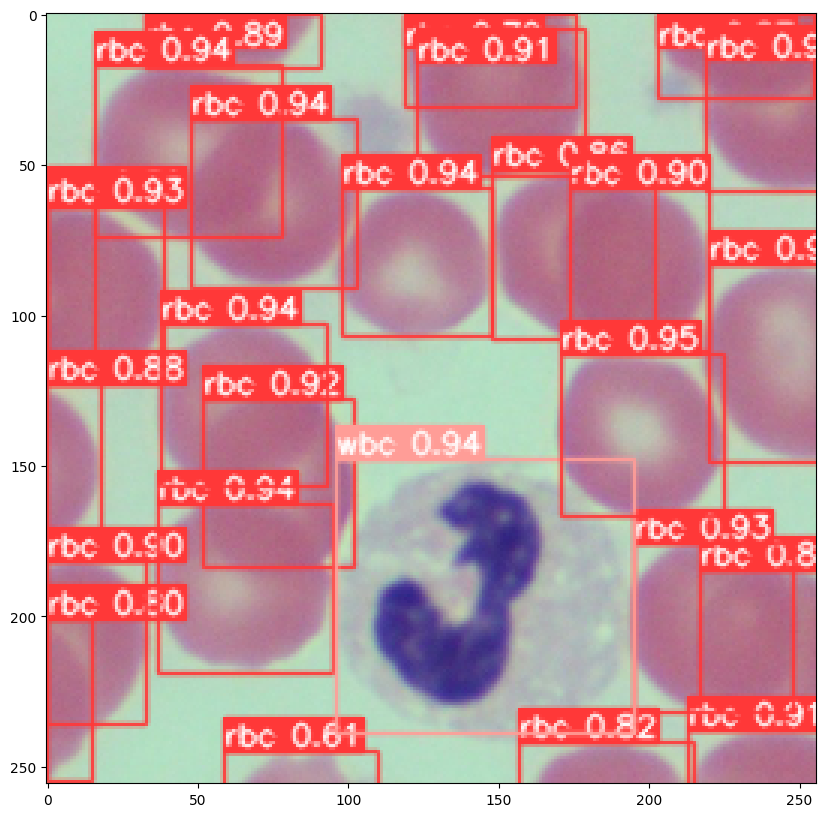

In [24]:

disp_images = '/content/yolov5/runs/detect/exp/image-91.png'
fig=plt.figure(figsize=(12, 10))
img = plt.imread(disp_images)
plt.imshow(img)
plt.show()

In [25]:
!python yolov5/detect.py --source /content/split/images/val/ --imgsz 256 --weights '/content/yolov5/runs/train/rbcdet_/weights/best.pt' --name '/content/inference/output' --line-thickness 1


detect: weights=['/content/yolov5/runs/train/rbcdet_/weights/best.pt'], source=/content/split/images/val/, data=yolov5/data/coco128.yaml, imgsz=[256, 256], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=/content/inference/output, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-274-g7d9a117 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/10 /content/split/images/val/image-22.png: 256x256 25 rbcs, 1 wbc, 5.7ms
image 2/10 /content/split/images/val/image-23.png: 256x256 23 rbcs, 1 wbc, 6.2ms
image 3/10 /content/split/images/val/image-24.png: 256x256 28 rbcs, 1 wbc, 5.4ms
image 4/10 /content/sp

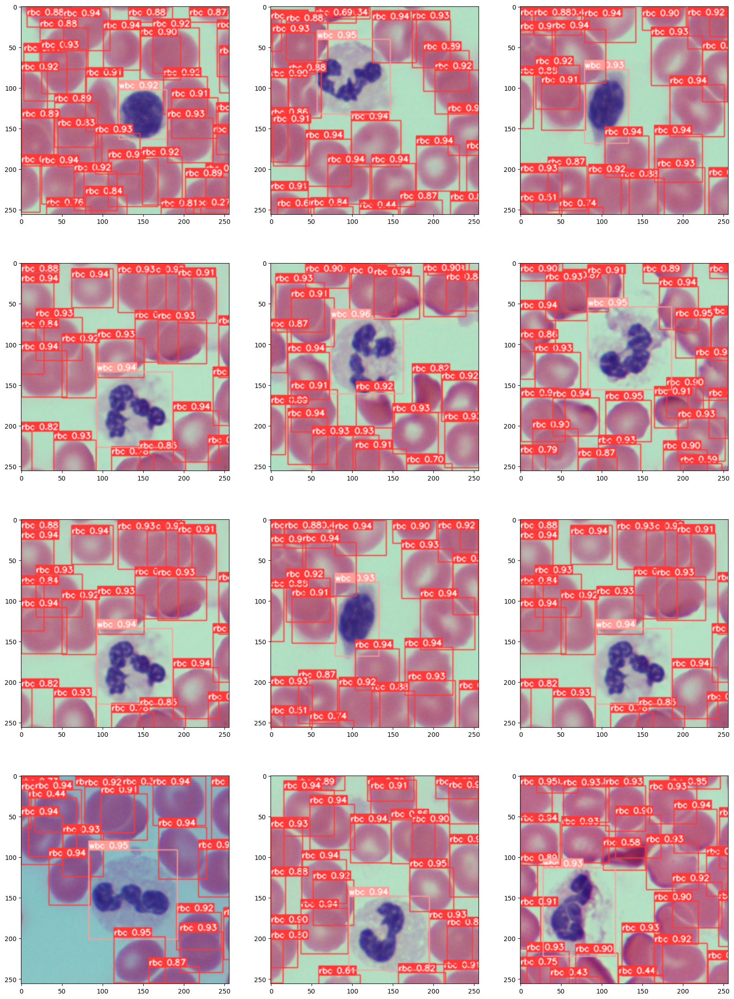

In [26]:
disp_images = glob('/content/inference/output/*')
fig = plt.figure(figsize=(20, 28))
columns = 3
rows = 4

for i in range(1, columns * rows + 1):
    img = np.random.choice(disp_images)
    img = plt.imread(img)
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)

plt.show()